In [1]:
import numpy as np
from scipy.io import wavfile
from scipy import signal
from scipy.special import softmax
from sklearn.decomposition import FastICA
import matplotlib.pyplot as plt
from IPython.display import Audio
from tqdm import tqdm
from itertools import combinations, islice
import math

# Poor man's beamforming and blind source separation

In [2]:
sample_rate, audio_raw = wavfile.read("../data/raw/noisy_mixture_32ch.wav")
audio_raw = audio_raw.T.astype(np.float64)
audio_raw = (audio_raw - audio_raw.mean(axis=1, keepdims=True)) / np.abs(audio_raw).max(axis=1, keepdims=True)

speech_idx = int(2/32 * audio_raw.shape[1])

In [3]:
print(f"Speech index: {speech_idx}")
print(f"Audio shape: {audio_raw.shape}")

Speech index: 82687
Audio shape: (32, 1323000)


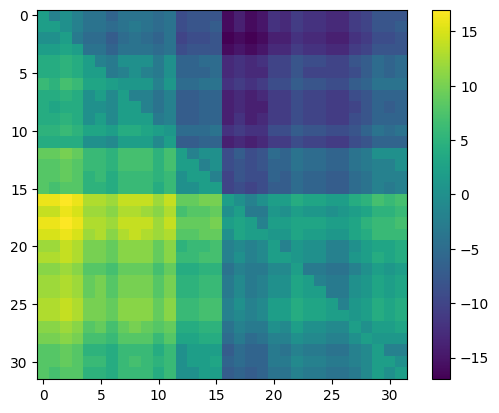

In [4]:
def get_lags(audio: np.ndarray):
    audio_fft = np.fft.rfft(audio, axis=1)
    audio_fft_rev = np.fft.rfft(audio[:, ::-1], axis=1)

    max_lags = np.zeros((audio.shape[0], audio.shape[0]), dtype=np.int64)
    
    for i in range(audio.shape[0]):
        for j in range(i, audio.shape[0]):
            corr = np.fft.irfft(audio_fft[i] * audio_fft_rev[j])
            max_lag = np.argmax(np.abs(corr))
            if abs(max_lag) > audio.shape[1]//2:
                max_lag = max_lag - audio.shape[1]
            max_lags[i, j] = max_lag
            max_lags[j, i] = -max_lags[i, j]

    return max_lags


lags = get_lags(audio_raw[:, :speech_idx])
plt.imshow(lags)
plt.colorbar()
plt.show()

In [5]:
audio_aligned = np.zeros(audio_raw.shape)

for i in range(32):
    right_pad = max(0, -lags[0, i])
    left_pad = max(0, lags[0, i])
    # if right_pad > 0:
    if right_pad >= 0:
        # audio_aligned[i] += np.pad(audio_raw[i], (right_pad, 0))[:-right_pad]
        audio_aligned[i] = np.pad(audio_raw[i], (0, right_pad))[right_pad:]
    else:
        # audio_aligned[i] += np.pad(audio_raw[i], (0, left_pad))[left_pad:]
        audio_aligned[i] = np.pad(audio_raw[i], (left_pad, 0))[:-left_pad]
        
Audio(audio_aligned.mean(0), rate=sample_rate)

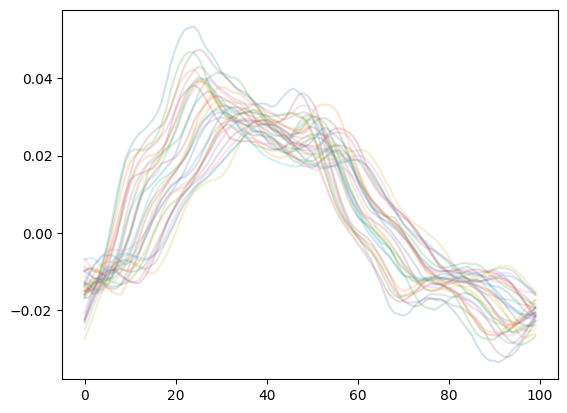

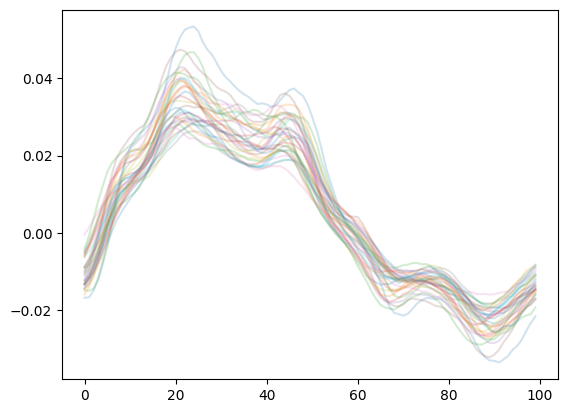

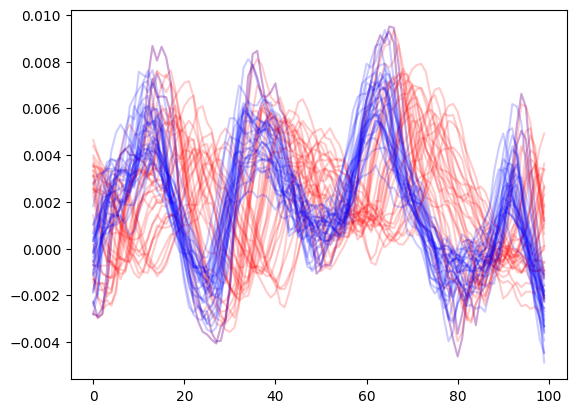

In [6]:
range_start = 100000
range_length = 100

plt.plot(audio_raw[:, range_start:range_start+range_length].T, alpha=0.2)
plt.show()

plt.plot(audio_aligned[:, range_start:range_start+range_length].T, alpha=0.2)
plt.show()

plt.plot(audio_raw[:, :100].T, color="red", alpha=0.2)
plt.plot(audio_aligned[:, :100].T, color="blue", alpha=0.2)
plt.show()

In [7]:
ica = FastICA(n_components=4, fun="cube", algorithm="deflation", max_iter=200)

start_step = 121+160+192+35150
score_best = 61935.478631551814
choices_best = (2, 3, 7, 10)
for a, b, c, d in tqdm(islice(combinations(range(len(audio_aligned)), 4), start_step, None), initial=start_step, total=math.comb(len(audio_aligned), 4) - start_step):
    sources = ica.fit_transform(audio_aligned[[a, b, c, d], :].T).T
    score = np.abs(audio_aligned[:, :speech_idx] @ sources[:, :speech_idx].T).sum(0).max()
    
    # TODO: The score should penalize the others from matching the speech

    if score > score_best:
        score_best = score
        choices_best = (a, b, c, d)
        print(score_best, choices_best)

In [8]:
ica = FastICA(n_components=32, fun="cube", algorithm="deflation", max_iter=200)
# sources = ica.fit_transform(audio_aligned[:, :speech_idx*8].T)
# sources = ica.fit_transform(audio_raw[:, :speech_idx*8].T).T

# sources = ica.fit_transform(audio_aligned.T).T

# audio_subset = audio_aligned[(2, 3, 7, 10), :]
# audio_subset[(0, 2, 3), :speech_idx] *= 0.1
# sources = ica.fit_transform(audio_subset.T).T

# speech_repeated = np.pad(np.tile(audio_aligned.mean(0)[:speech_idx], audio_aligned.shape[1] // speech_idx), ((0, audio_aligned.shape[1] % speech_idx),)).reshape(1, -1)
# sources = ica.fit(audio_aligned.T + speech_repeated.T * 2).transform(audio_aligned.T).T


In [170]:
from pyroomacoustics.bss.auxiva import auxiva

# window = signal.windows.hann(512)
# stft = signal.ShortTimeFFT(window, 160, sample_rate)
window = signal.windows.hann(1024)
stft = signal.ShortTimeFFT(window, 160, sample_rate)

# audio_stft = stft.stft(audio_aligned[(2, 3, 7, 10), :], axis=1)
audio_stft = stft.stft(audio_aligned[(0, 1, 2, 3), :], axis=1)
sources_stft, demixer = auxiva(audio_stft.T, n_src=4, init_eig=True, n_iter=100, return_filters=True)
sources = stft.istft(sources_stft.T)


[6808.23761605   14.84273128   44.43111179   27.67214078]


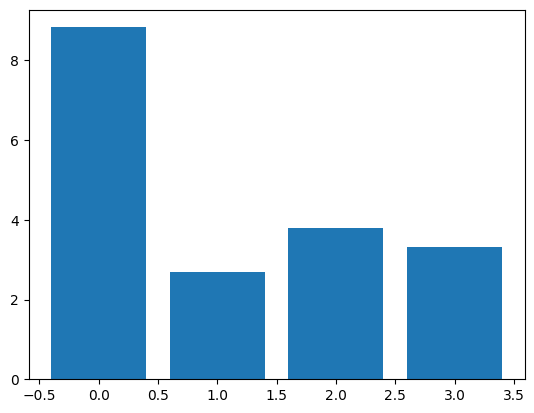

In [171]:
importance = np.abs(audio_aligned[:, :speech_idx] @ sources[:, :speech_idx].T).sum(0)
# importance = np.abs(audio_raw[:, :speech_idx] @ sources[:, :speech_idx].T).sum(0)
print(importance)
plt.bar(range(len(importance)), np.log(importance))
plt.show()

In [186]:
from speechbrain.inference.separation import SepformerSeparation as separator
from speechbrain.inference.enhancement import WaveformEnhancement, SpectralMaskEnhancement
import torch as th
from scipy.signal import resample
# model = separator.from_hparams(
#     source="speechbrain/sepformer-dns4-16k-enhancement",
#     savedir='../models/sepformer-dns4-16k-enhancement',
#     run_opts={"device": "cuda"}
# )
# model = SpectralMaskEnhancement.from_hparams(
#     source="speechbrain/metricgan-plus-voicebank",
#     savedir="../models/metricgan-plus-voicebank",
#     run_opts={"device": "cuda"}
# )
model = WaveformEnhancement.from_hparams(
    source="speechbrain/mtl-mimic-voicebank",
    savedir="../models/mtl-mimic-voicebank",
    run_opts={"device": "cuda"}
)

with th.no_grad():
    model = model.eval()
    # out = model.separate_batch(th.tensor(resample(enhanced_audio[:1, :], int(enhanced_audio.shape[1] / sample_rate * 16000), axis=1), dtype=th.float))
    out = model.enhance_batch(th.tensor(resample(enhanced_audio[:1, :], int(enhanced_audio.shape[1] / sample_rate * 16000), axis=1), dtype=th.float), lengths=th.tensor([1.]))
    # out = model.enhance_batch(th.tensor(resample(sources[:1, :], int(sources.shape[1] / sample_rate * 16000), axis=1), dtype=th.float), lengths=th.tensor([1.]))
    # out = model.enhance_batch(th.tensor(resample(audio_aligned[3:4, :], int(audio_aligned.shape[1] / sample_rate * 16000), axis=1), dtype=th.float), lengths=th.tensor([1.]))
    # out = model.enhance_batch(th.tensor(resample(voice_clean.reshape(1, -1), int(voice_clean.shape[0] / sample_rate * 16000), axis=1), dtype=th.float), lengths=th.tensor([1.]))

Audio(out.squeeze().float().cpu(), rate = 16000)

In [185]:
from df import enhance, init_df


model, df_state, _ = init_df("DeepFilterNet2")
enhanced_audio = enhance(model, df_state, th.tensor(sources[:1]*3, dtype=th.float32), atten_lim_db=8)
enhanced_audio = enhance(model, df_state, enhanced_audio, atten_lim_db=8)
display(Audio(sources[0], rate=sample_rate))
display(Audio(enhanced_audio, rate=sample_rate))
# wavfile.write("../clean7.wav", 44100, np.float32(enhanced_audio[0]))

2024-04-16 18:58:13 | INFO     | DF | Loading model settings of DeepFilterNet2
2024-04-16 18:58:13 | INFO     | DF | Using DeepFilterNet3 model at /home/non-root/.cache/DeepFilterNet/DeepFilterNet2
2024-04-16 18:58:13 | INFO     | DF | Initializing model `deepfilternet2`
2024-04-16 18:58:13 | INFO     | DF | Found checkpoint /home/non-root/.cache/DeepFilterNet/DeepFilterNet2/checkpoints/model_96.ckpt.best with epoch 96
2024-04-16 18:58:13 | INFO     | DF | Running on device cuda:0
2024-04-16 18:58:13 | INFO     | DF | Model loaded


In [184]:
voice_idx = np.argpartition(importance, -1)[-1:]
noise_idx = np.argpartition(-importance, -1)[-1:]


window = signal.windows.hann(512)
stft = signal.ShortTimeFFT(window, 160, sample_rate)
# voice_fft = stft.stft(sources[voice_idx], axis=1)
voice_fft = stft.stft(enhanced_audio.numpy(), axis=1)
noise_fft = stft.stft(sources[noise_idx], axis=1)


# from scipy.special import softmax
# voice_clean_fft = voice_fft.mean(0) * ((1- np.abs(noise_fft).mean(0) / np.abs(noise_fft).mean(0).max())**4)
# voice_clean_fft = voice_fft.mean(0) * ((1- softmax(np.abs(noise_fft), axis=0).mean(0) / softmax(np.abs(noise_fft), axis=0).mean(0).max(0)))

mask = np.abs(voice_fft[..., :speech_idx]).mean(0).mean(1, keepdims=True) / np.abs(voice_fft[..., :speech_idx]).mean(0).mean(1, keepdims=True).max()
mask[:10] *= 0.10
mask[40:] *= 0.05
# voice_clean_fft = voice_clean_fft * mask
voice_clean_fft = voice_fft * mask

voice_clean = stft.istft(voice_clean_fft).squeeze()
display(Audio(sources[voice_idx], rate=sample_rate))
display(Audio(voice_clean, rate=sample_rate))